Within the tumor microenvironment there are multiple examples of cell-cell interactions. This tutorial will focus on interactions between cancer cells and immune cells, focusing on possible connections between specific immune cells and the epithelial-mesenchymal transition (EMT).

The computational pipleine can be divided into 3 main steps which will highlight different computational tools, machine learning methods and important considerations while dealing with single-cell (SC) and spatial transcriptomics (ST).

1) Analysis and celltype deconvoultion of ST with SC reference datset using Optimal Transport (OT).
2) Analysis of EMT in a single cell dataset.
3) Assinging EMT states to ST and finding immune cells that correlate with EMT.



In [1]:
!pip install scanpy tacco scvi-tools[cuda] --quiet

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.4/191.4 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 846.0/846.0 kB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.4/259.4 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 43.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.5/82.5 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 45.8 MB/s eta 0:00:00
   ━━━━━

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scvi
import tacco as tc
import json

# Deconvolution of ST with OT and SC refernce

The ST dataset is a Visium v'1 experiment where each spot has a 55 micron radius capture area. This means that each spot contains multiple cells and celltypes. To understand what cells are in the data, we will use a SC reference to help deconvolve the spatial spots into cell types.

download SC and ST data  

In [3]:
#https://cellxgene.cziscience.com/collections/dea97145-f712-431c-a223-6b5f565f362a
#https://www.nature.com/articles/s41588-021-00911-1#Abs1
!wget https://datasets.cellxgene.cziscience.com/36e652b0-995c-415a-9975-55679ad645e2.h5ad
!wget https://datasets.cellxgene.cziscience.com/0e3974a1-9488-4987-9767-21d4e389fac7.h5ad

--2025-12-01 13:18:06--  https://datasets.cellxgene.cziscience.com/36e652b0-995c-415a-9975-55679ad645e2.h5ad
Resolving datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)... 3.165.160.82, 3.165.160.14, 3.165.160.58, ...
Connecting to datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)|3.165.160.82|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214365488 (204M) [binary/octet-stream]
Saving to: ‘36e652b0-995c-415a-9975-55679ad645e2.h5ad’

36e652b0-995c-415a- 100%[===================>] 204.43M   210MB/s    in 1.0s    

2025-12-01 13:18:07 (210 MB/s) - ‘36e652b0-995c-415a-9975-55679ad645e2.h5ad’ saved [214365488/214365488]

--2025-12-01 13:18:07--  https://datasets.cellxgene.cziscience.com/0e3974a1-9488-4987-9767-21d4e389fac7.h5ad
Resolving datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)... 3.165.160.82, 3.165.160.14, 3.165.160.58, ...
Connecting to datasets.cellxgene.cziscience.com (datasets.cellxgene.czi

In [4]:
st_adata=sc.read("/content/36e652b0-995c-415a-9975-55679ad645e2.h5ad")
print(st_adata.var_names[:3])
st_adata.var_names=st_adata.var["feature_name"].astype(str).copy()
st_adata.var_names_make_unique()
print(st_adata.var_names[:3])
st_adata.obs_names_make_unique()
st_adata

Index(['ENSG00000243485', 'ENSG00000237613', 'ENSG00000186092'], dtype='object')
Index(['MIR1302-2HG', 'FAM138A', 'OR4F5'], dtype='object', name='feature_name')


AnnData object with n_obs × n_vars = 4992 × 35477
    obs: 'in_tissue', 'array_row', 'array_col', 'assay_ontology_term_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'subtype', 'Classification', 'donor_id', 'Grade', 'Cancer Type', 'ER', 'PR', 'HER2 IHC', 'HER2 ISH (ratio)', 'Ki67', 'Subtype by IHC', 'Treatment status', 'Stage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'B cells Memory', 'B cells Naive', 'CAFs MSC iCAF-like', 'CAFs myCAF-like', 'Cancer Basal SC', 'Cancer Cycling', 'Cancer Her2 SC', 'Cancer LumA SC', 'Cancer LumB SC', 'Cycling PVL', 'Cycling T-cells', 'Cycling_Myeloid', 'DCs', 'Endothelial ACKR1', 'Endothelial CXCL12', 'Endothelial Lymphatic LYVE1', 'Endothelial RGS5', 'Luminal Progenitors', 'Macrophage', 'Mature Luminal', 'Monocyte', 'Myoepithelial', 'NK cells', 'NKT cells', 'PVL Differentiated', 'PVL Immature', 

Plotting the ST data with some relevant metadata
 can help us get a sense of our tissue sample.

 We can see that the most of the spots don't contain tissue and aren't from cancerous regions. We will remove all spots that are outside the tissue section and aren't cancerous/immune cells.   

/tmp/ipython-input-2785833958.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(st_adata,color=["subtype","in_tissue"],library_id='CID44971')


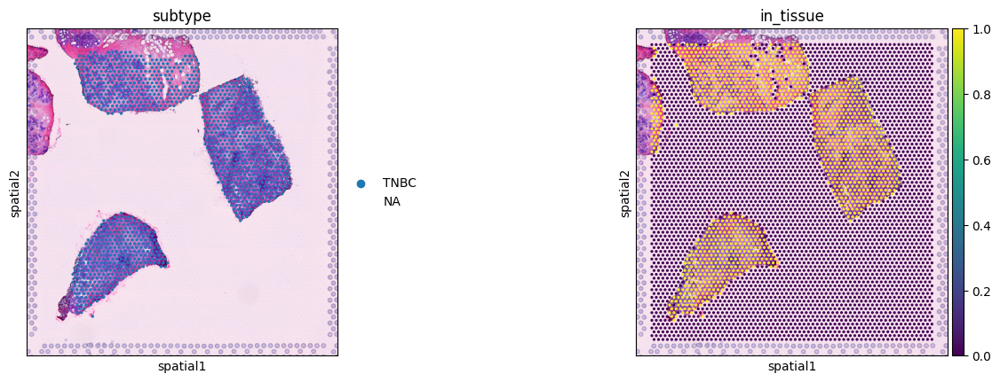

In [5]:
sc.pl.spatial(st_adata,color=["subtype","in_tissue"],library_id='CID44971')

/tmp/ipython-input-1334400136.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(st_adata,color=['Classification'],library_id='CID44971',alpha_img=0)


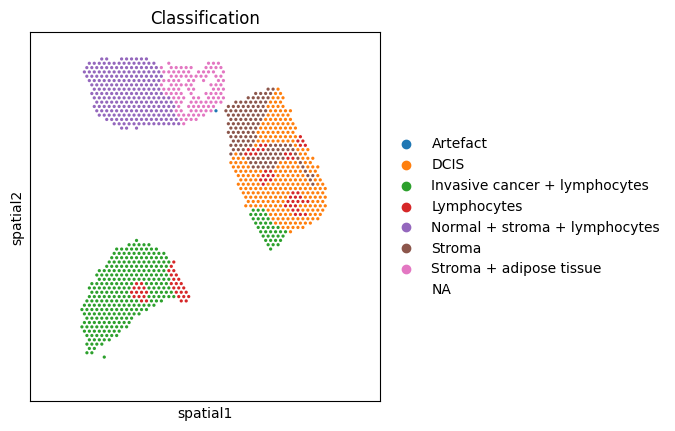

In [6]:
sc.pl.spatial(st_adata,color=['Classification'],library_id='CID44971',alpha_img=0)

In [7]:
st_adata=st_adata[st_adata.obs.in_tissue==1].copy()
st_adata.shape

(1317, 35477)

In [8]:
st_adata=st_adata[st_adata.obs["Classification"].isin(['DCIS', 'Invasive cancer + lymphocytes', 'Lymphocytes',])]
st_adata

View of AnnData object with n_obs × n_vars = 671 × 35477
    obs: 'in_tissue', 'array_row', 'array_col', 'assay_ontology_term_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'subtype', 'Classification', 'donor_id', 'Grade', 'Cancer Type', 'ER', 'PR', 'HER2 IHC', 'HER2 ISH (ratio)', 'Ki67', 'Subtype by IHC', 'Treatment status', 'Stage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'B cells Memory', 'B cells Naive', 'CAFs MSC iCAF-like', 'CAFs myCAF-like', 'Cancer Basal SC', 'Cancer Cycling', 'Cancer Her2 SC', 'Cancer LumA SC', 'Cancer LumB SC', 'Cycling PVL', 'Cycling T-cells', 'Cycling_Myeloid', 'DCs', 'Endothelial ACKR1', 'Endothelial CXCL12', 'Endothelial Lymphatic LYVE1', 'Endothelial RGS5', 'Luminal Progenitors', 'Macrophage', 'Mature Luminal', 'Monocyte', 'Myoepithelial', 'NK cells', 'NKT cells', 'PVL Differentiated', 'PVL Imma

/tmp/ipython-input-1334400136.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(st_adata,color=['Classification'],library_id='CID44971',alpha_img=0)


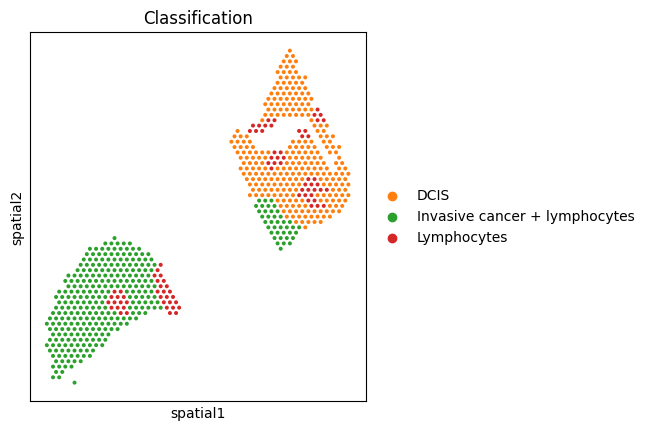

In [9]:
sc.pl.spatial(st_adata,color=['Classification'],library_id='CID44971',alpha_img=0)

We read the SC dataset and plot the various cell-type annotations. Additionaly, we will only use cells from Triple Negative Breast Cancer (TNBC) to match our ST sample.  

In [10]:
sc_adata=sc.read("/content/0e3974a1-9488-4987-9767-21d4e389fac7.h5ad")
print(sc_adata.var_names[:3])
sc_adata.var_names=sc_adata.var["feature_name"].astype(str).copy()
sc_adata.var_names_make_unique()
print(sc_adata.var_names[:3])
sc_adata.obs_names_make_unique()
sc_adata

Index(['ENSG00000279928', 'ENSG00000279457', 'ENSG00000228463'], dtype='object')
Index(['DDX11L17', 'WASH9P', 'ENSG00000228463'], dtype='object', name='feature_name')


AnnData object with n_obs × n_vars = 100064 × 28468
    obs: 'donor_id', 'percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'calls', 'normal_cell_call', 'CNA_value', 'batch_run', 'multiplexed', 'cryo_state', 'development_stage_ontology_term_id', 'cancer_type', 'ER', 'PR', 'HER2_IHC', 'HER2_ISH', 'HER2_ISH_ratio', 'Ki67', 'subtype_by_IHC', 'treatment_status', 'treatment_details', 'assay_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'disease_ontology_term_id', 'grade', 'cell_type_ontology_term_id', 'tissue_type', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'organism', 'organism_ontology_term_id',

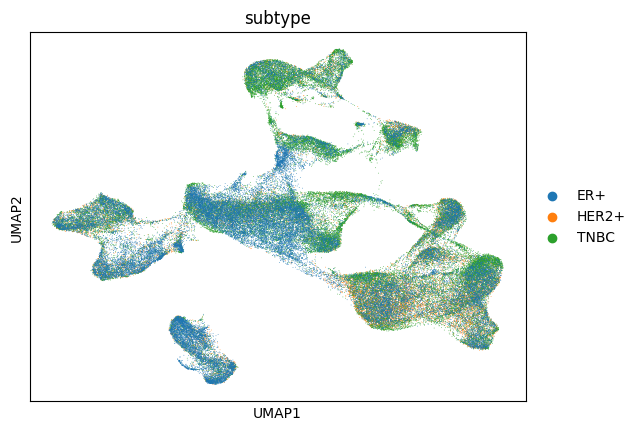

In [11]:
sc.pl.umap(sc_adata,color="subtype")

In [12]:
sc_adata=sc_adata[sc_adata.obs.subtype=="TNBC"].copy()
sc_adata.shape

(42512, 28468)

In [13]:
sc_adata.X=sc_adata.raw.X.copy()
#make sure data is raw counts (integers)
sc_adata.X.data

array([ 1.,  1.,  1., ...,  4.,  1., 13.], dtype=float32)

In [14]:
st_adata.X.data

array([ 2.,  2.,  1., ...,  8.,  1., 49.], dtype=float32)

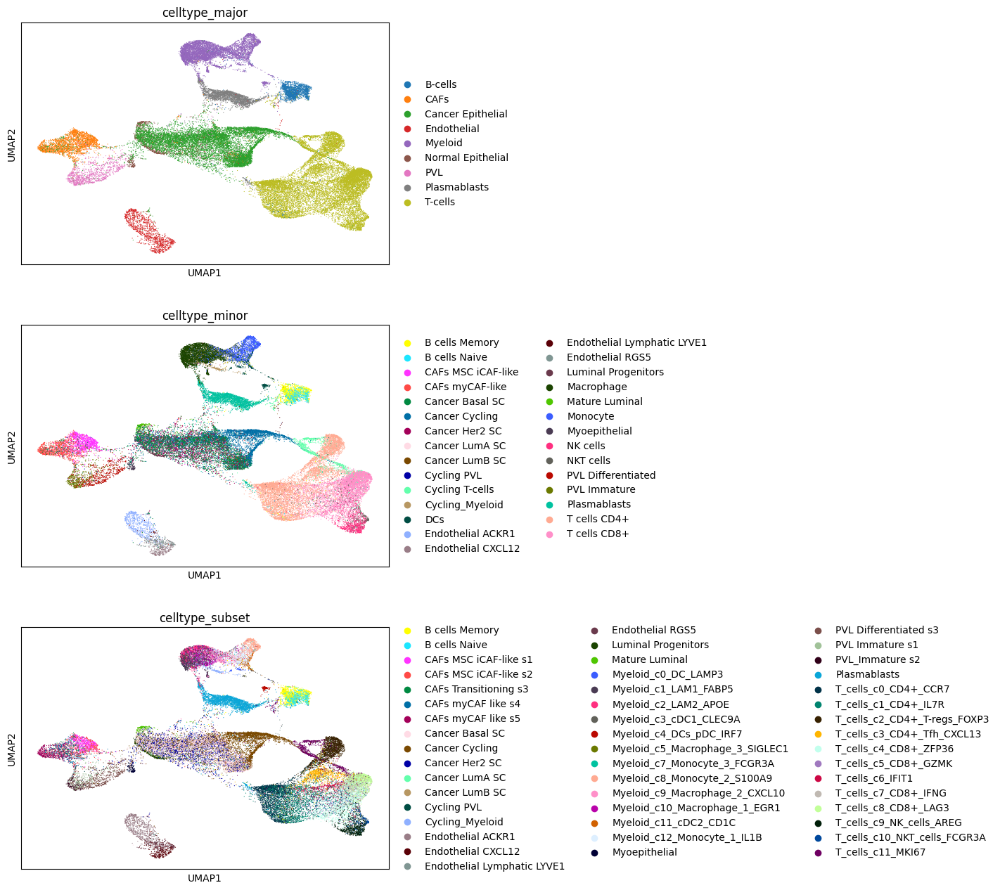

In [15]:
sc.pl.umap(sc_adata,color=['celltype_major', 'celltype_minor', 'celltype_subset', ],ncols=1)

Now we will do some basic preprocessing and quality control by filtering extremely rare genes, cells/spots with very few genes and outliers with too many counts (the SC data was already processed and filtered by the authors).

In [16]:
sc.pp.filter_genes(st_adata,min_cells=10)
sc.pp.filter_genes(sc_adata,min_cells=10)
sc.pp.filter_cells(st_adata,min_counts=100)
sc.pp.filter_cells(st_adata,min_genes=100)
sc.pp.filter_cells(sc_adata,min_genes=100)

/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_simple.py:293: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


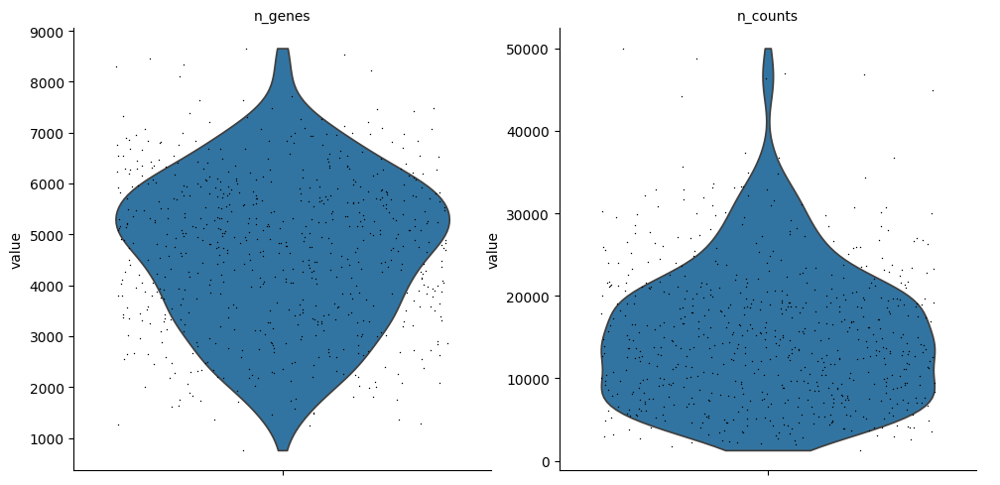

In [17]:
sc.pl.violin(st_adata, ['n_genes', 'n_counts'],
             jitter=0.4, multi_panel=True)

In [18]:
sc.pp.filter_cells(st_adata,max_counts=40000)
st_adata.shape

(664, 15686)

Here we aggregate our SC data into psuedobulk profiles for each celltype. This optional step condenses the data from thousands of cells to 49 cells which will be computationally less expensive during deconvolution.

In [19]:
pb_data=sc.get.aggregate(sc_adata,by="celltype_subset",func="mean")
pb_data.X=pb_data.layers["mean"].copy()
pb_data.X=pb_data.X.astype(int)
pb_data.obs["celltype_subset"]=pb_data.obs_names
pb_data

AnnData object with n_obs × n_vars = 49 × 22133
    obs: 'celltype_subset'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'n_cells'
    layers: 'mean'

# Decovolution with Optimal Transport using [TACCO](https://www.nature.com/articles/s41587-023-01657-3)


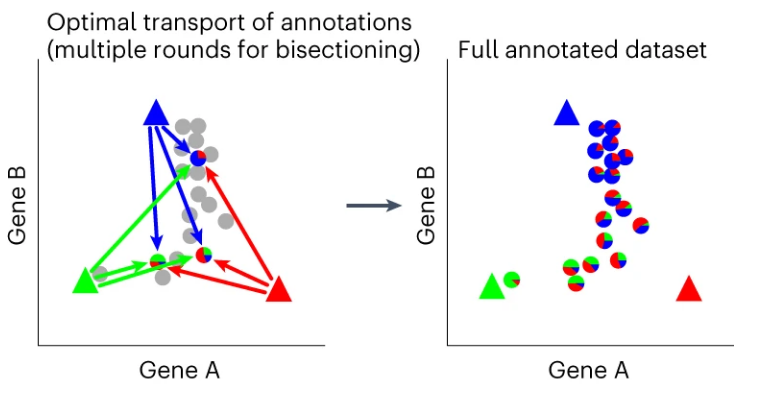

Different methods exist for deconvolution of ST. We will use Optimal transport due to it's accurate results, computational speed, efficiency, and intiuitive approach.


In [20]:
tc.tl.annotate(st_adata, reference=pb_data, annotation_key='celltype_subset', result_key='celltype_subset',
               method='OT',  lamb=0,
               min_counts_per_cell=1, min_cells_per_gene=1, min_genes_per_cell=1,
               min_log2foldchange=0,
               remove_mito=True, n_hvg=None,  verbose=3, )

Starting preprocessing
Annotation profiles were not found in `reference.varm["celltype_subset"]`. Constructing reference profiles with `tacco.preprocessing.construct_reference_profiles` and default arguments...
mito: good gene fraction 0.999412641756653 good count fraction 0.9182020298697933
Finished preprocessing in 2.28 seconds.
Starting annotation of data with shape (664, 3930) and a reference of shape (49, 3930) using the following wrapped method:
+- platform normalization: platform_iterations=0, gene_keys=celltype_subset, normalize_to=adata
   +- multi center: multi_center=None multi_center_amplitudes=True
      +- bisection boost: bisections=4, bisection_divisor=3
         +- core: method=OT annotation_prior=None lamb=0
mean,std( rescaling(gene) )  185.79370561298018 257.397934526288
bisection run on 1
bisection run on 0.6666666666666667
bisection run on 0.4444444444444444
bisection run on 0.2962962962962963
bisection run on 0.19753086419753085
bisection run on 0.0987654320987654

AnnData object with n_obs × n_vars = 664 × 15686
    obs: 'in_tissue', 'array_row', 'array_col', 'assay_ontology_term_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'subtype', 'Classification', 'donor_id', 'Grade', 'Cancer Type', 'ER', 'PR', 'HER2 IHC', 'HER2 ISH (ratio)', 'Ki67', 'Subtype by IHC', 'Treatment status', 'Stage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'B cells Memory', 'B cells Naive', 'CAFs MSC iCAF-like', 'CAFs myCAF-like', 'Cancer Basal SC', 'Cancer Cycling', 'Cancer Her2 SC', 'Cancer LumA SC', 'Cancer LumB SC', 'Cycling PVL', 'Cycling T-cells', 'Cycling_Myeloid', 'DCs', 'Endothelial ACKR1', 'Endothelial CXCL12', 'Endothelial Lymphatic LYVE1', 'Endothelial RGS5', 'Luminal Progenitors', 'Macrophage', 'Mature Luminal', 'Monocyte', 'Myoepithelial', 'NK cells', 'NKT cells', 'PVL Differentiated', 'PVL Immature', '

The result will be cell-type proprtions (CTP) of each reference cell type assigned to each ST spot.

In [21]:
st_adata.obsm["celltype_subset"].head()

celltype_subset,B cells Memory,B cells Naive,CAFs MSC iCAF-like s1,CAFs MSC iCAF-like s2,CAFs Transitioning s3,CAFs myCAF like s4,CAFs myCAF like s5,Cancer Basal SC,Cancer Cycling,Cancer Her2 SC,...,T_cells_c11_MKI67,T_cells_c1_CD4+_IL7R,T_cells_c2_CD4+_T-regs_FOXP3,T_cells_c3_CD4+_Tfh_CXCL13,T_cells_c4_CD8+_ZFP36,T_cells_c5_CD8+_GZMK,T_cells_c6_IFIT1,T_cells_c7_CD8+_IFNG,T_cells_c8_CD8+_LAG3,T_cells_c9_NK_cells_AREG
AAACACCAATAACTGC-1,4.429364e-15,8.785877e-17,0.000029,0.000152,0.000010,1.146065e-06,1.410441e-05,0.365598,0.187807,5.988654e-05,...,1.427650e-05,3.766902e-12,5.458705e-10,7.430055e-11,1.489743e-10,2.248016e-13,5.246262e-11,3.291816e-11,4.301132e-10,2.762062e-11
AAACAGAGCGACTCCT-1,4.562140e-02,5.658407e-08,0.000035,0.009303,0.000002,1.040263e-05,3.526871e-07,0.331376,0.118124,1.441729e-04,...,1.514092e-03,2.927647e-05,9.114556e-06,6.386140e-05,5.144409e-05,7.754961e-07,2.102989e-05,8.029554e-07,1.012267e-06,1.371961e-05
AAACCGTTCGTCCAGG-1,2.501990e-08,8.224546e-17,0.000036,0.000004,0.001328,5.653766e-06,9.635268e-02,0.114518,0.135889,1.804365e-09,...,1.303253e-10,1.905636e-16,4.275916e-15,2.651569e-15,1.173254e-14,2.078606e-16,3.491788e-14,1.758147e-14,2.993088e-14,6.985092e-15
AAAGGCCCTATAATAC-1,2.830773e-19,2.056698e-23,0.001055,0.000030,0.007212,4.500260e-07,7.274211e-02,0.333229,0.096068,3.402391e-06,...,4.421493e-12,9.918089e-18,3.915482e-15,1.957631e-15,4.213541e-16,1.942517e-20,2.628335e-16,3.594568e-17,2.415302e-15,9.821037e-17
AAAGTAGCATTGCTCA-1,2.974727e-16,2.036979e-14,0.000009,0.003679,0.000007,7.807389e-06,2.978181e-07,0.333185,0.144012,7.230003e-04,...,6.163952e-06,2.468796e-08,8.590754e-07,5.238284e-07,2.996293e-07,3.338588e-10,2.580941e-07,2.734290e-08,7.828214e-07,9.038902e-08


The total CTP for each spot will 1.

In [22]:
st_adata.obsm["celltype_subset"].head().sum(1)

,0
AAACACCAATAACTGC-1,1.0
AAACAGAGCGACTCCT-1,1.0
AAACCGTTCGTCCAGG-1,1.0
AAAGGCCCTATAATAC-1,1.0
AAAGTAGCATTGCTCA-1,1.0


We can plot the CTPs for each cell type to find their distribution in the tissue.

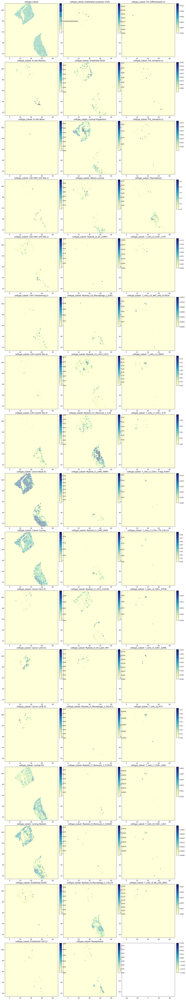

In [23]:
tc.pl.scatter(st_adata,keys="celltype_subset",position_key=('array_row', 'array_col'),cmap="YlGnBu",joint=None,n_cols=3,point_size=10);

We used the highest resoultion annotations for the deconvolution and can aggregate these values into the lower resolution annotations. Now we can assign coarser CTPs for the spots.  

In [24]:
cluster2type = sc_adata.obs[['celltype_subset','celltype_minor']].drop_duplicates().groupby('celltype_minor')['celltype_subset'].agg(lambda x: list(x.to_numpy()))
tc.utils.merge_annotation(st_adata, 'celltype_subset', cluster2type, 'celltype_minor');

/tmp/ipython-input-3826567460.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster2type = sc_adata.obs[['celltype_subset','celltype_minor']].drop_duplicates().groupby('celltype_minor')['celltype_subset'].agg(lambda x: list(x.to_numpy()))


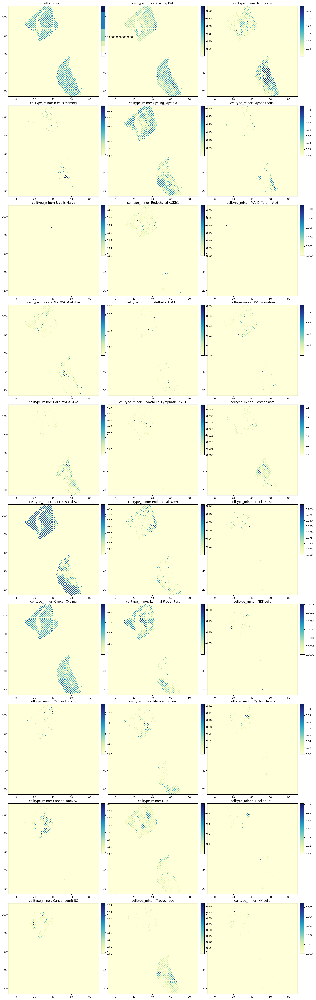

In [25]:
tc.pl.scatter(st_adata,keys="celltype_minor",position_key=('array_row', 'array_col'),cmap="YlGnBu",joint=None,n_cols=3,point_size=10);

In [26]:
cluster2type = sc_adata.obs[['celltype_subset','celltype_major']].drop_duplicates().groupby('celltype_major')['celltype_subset'].agg(lambda x: list(x.to_numpy()))
tc.utils.merge_annotation(st_adata, 'celltype_subset', cluster2type, 'celltype_major');

/tmp/ipython-input-216008059.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster2type = sc_adata.obs[['celltype_subset','celltype_major']].drop_duplicates().groupby('celltype_major')['celltype_subset'].agg(lambda x: list(x.to_numpy()))


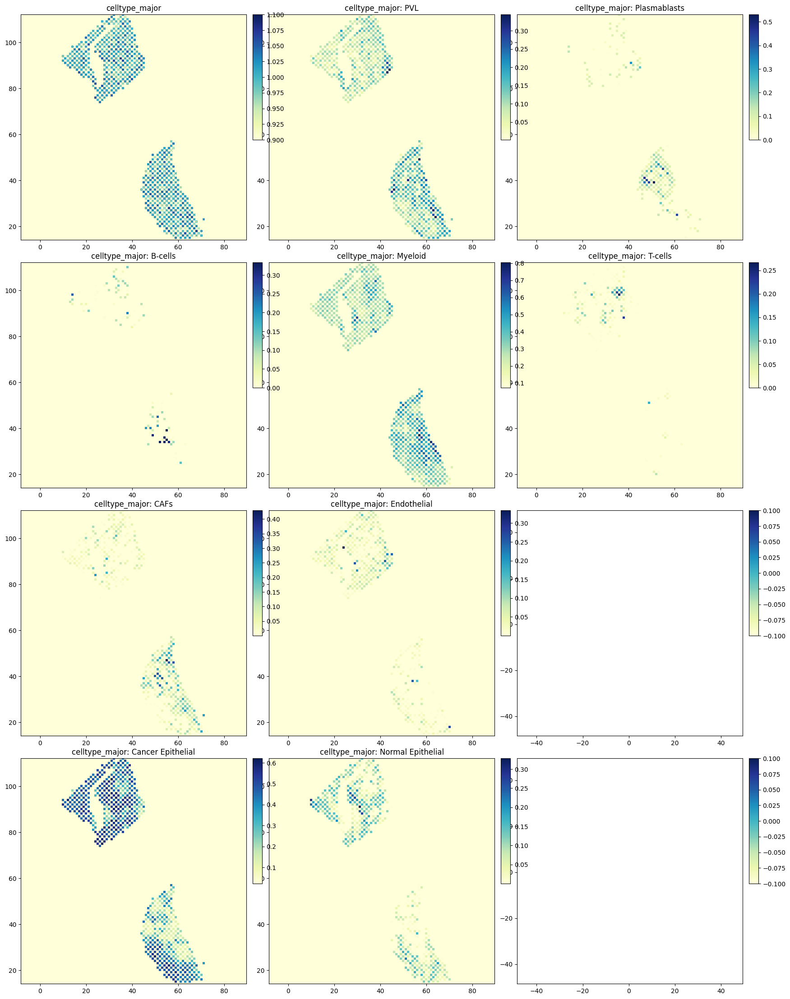

In [27]:
tc.pl.scatter(st_adata,keys="celltype_major",position_key=('array_row', 'array_col'),cmap="YlGnBu",joint=None,n_cols=3,point_size=10);

# EMT state dataset

To characterize EMT states in the ST, we will first download a SC dataset where the researchers induced EMT in cells. EMT was induced in a breast cancer cell line with a drug using different concentrations.

In [3]:
!wget https://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6593nnn/GSM6593509/suppl/GSM6593509%5FConcentration%5FGBC%5Fannotation%5FSamples.csv.gz
!wget https://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6593nnn/GSM6593509/suppl/GSM6593509%5Fbarcodes.tsv.gz
!wget https://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6593nnn/GSM6593509/suppl/GSM6593509%5Fgenes.tsv.gz
!wget https://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6593nnn/GSM6593509/suppl/GSM6593509%5Fmatrix.mtx.gz




--2025-12-02 17:50:37--  https://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6593nnn/GSM6593509/suppl/GSM6593509%5FConcentration%5FGBC%5Fannotation%5FSamples.csv.gz
Resolving ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)... 130.14.250.31, 130.14.250.7, 130.14.250.10, ...
Connecting to ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)|130.14.250.31|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47357 (46K) [application/x-gzip]
Saving to: ‘GSM6593509_Concentration_GBC_annotation_Samples.csv.gz’

GSM6593509_Concentr 100%[===================>]  46.25K  --.-KB/s    in 0.1s    

2025-12-02 17:50:38 (400 KB/s) - ‘GSM6593509_Concentration_GBC_annotation_Samples.csv.gz’ saved [47357/47357]

--2025-12-02 17:50:38--  https://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6593nnn/GSM6593509/suppl/GSM6593509%5Fbarcodes.tsv.gz
Resolving ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)... 130.14.250.31, 130.14.250.7, 130.14.250.10, ...
Connecting to ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)|130.14.250.3

As the data isn't an AnnData object, we will create one ourselves.

In [4]:
adata=sc.read_mtx("/content/GSM6593509_matrix.mtx.gz").T
adata

AnnData object with n_obs × n_vars = 11284 × 33694

In [5]:
genes=pd.read_csv("/content/GSM6593509_genes.tsv.gz",sep="\t",header=None)
genes

,0,1
0,ENSG00000243485,RP11-34P13.3
1,ENSG00000237613,FAM138A
2,ENSG00000186092,OR4F5
3,ENSG00000238009,RP11-34P13.7
4,ENSG00000239945,RP11-34P13.8
...,...,...
33689,ENSG00000277856,AC233755.2
33690,ENSG00000275063,AC233755.1
33691,ENSG00000271254,AC240274.1
33692,ENSG00000277475,AC213203.1


In [6]:
barcodes=pd.read_csv("/content/GSM6593509_barcodes.tsv.gz",header=None)
barcodes

,0
0,AAACCTGAGAAAGTGG-1
1,AAACCTGAGACTAGGC-1
2,AAACCTGAGATCACGG-1
3,AAACCTGAGCTCCTCT-1
4,AAACCTGAGCTGCAAG-1
...,...
11279,TTTGTCAGTCTCAACA-1
11280,TTTGTCAGTTCGGGCT-1
11281,TTTGTCATCCCTAACC-1
11282,TTTGTCATCCTTCAAT-1


In [7]:
adata.obs_names=barcodes[0].values
adata.var_names=genes[1].values
adata.obs_names,adata.var_names

(Index(['AAACCTGAGAAAGTGG-1', 'AAACCTGAGACTAGGC-1', 'AAACCTGAGATCACGG-1',
        'AAACCTGAGCTCCTCT-1', 'AAACCTGAGCTGCAAG-1', 'AAACCTGAGGCCCTTG-1',
        'AAACCTGCAAACAACA-1', 'AAACCTGCATTCTCAT-1', 'AAACCTGGTCCAAGTT-1',
        'AAACCTGGTCTTGCGG-1',
        ...
        'TTTGTCACACGGATAG-1', 'TTTGTCACAGCTGGCT-1', 'TTTGTCACATTGTGCA-1',
        'TTTGTCAGTAAGTGGC-1', 'TTTGTCAGTCTACCTC-1', 'TTTGTCAGTCTCAACA-1',
        'TTTGTCAGTTCGGGCT-1', 'TTTGTCATCCCTAACC-1', 'TTTGTCATCCTTCAAT-1',
        'TTTGTCATCTCTGTCG-1'],
       dtype='object', length=11284),
 Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
        'RP11-34P13.14', 'RP11-34P13.9', 'FO538757.3', 'FO538757.2',
        'AP006222.2',
        ...
        'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
        'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231B'],
       dtype='object', length=33694))

In [8]:
adata.var_names_make_unique()

In [9]:
adata.X.data

array([1., 1., 1., ..., 1., 1., 1.], dtype=float32)

The accompaniying metedata relates to the concentration of drug used to induce EMT. We will use these values to evaluate EMT status and remove cells without a value.

In [10]:

metadata=pd.read_csv("/content/GSM6593509_Concentration_GBC_annotation_Samples.csv.gz",index_col=0)
metadata

,GBC_annot,Values
Sample,,
AAACCTGAGAAAGTGG-1,GBC2,2
AAACCTGAGATCACGG-1,GBC4,4
AAACCTGAGCTCCTCT-1,GBC9,9
AAACCTGAGCTGCAAG-1,GBC1,1
AAACCTGAGGCCCTTG-1,GBC13,13
...,...,...
TTTGTCAGTCTCAACA-1,GBC2,2
TTTGTCAGTTCGGGCT-1,GBC9,9
TTTGTCATCCCTAACC-1,GBC1,1


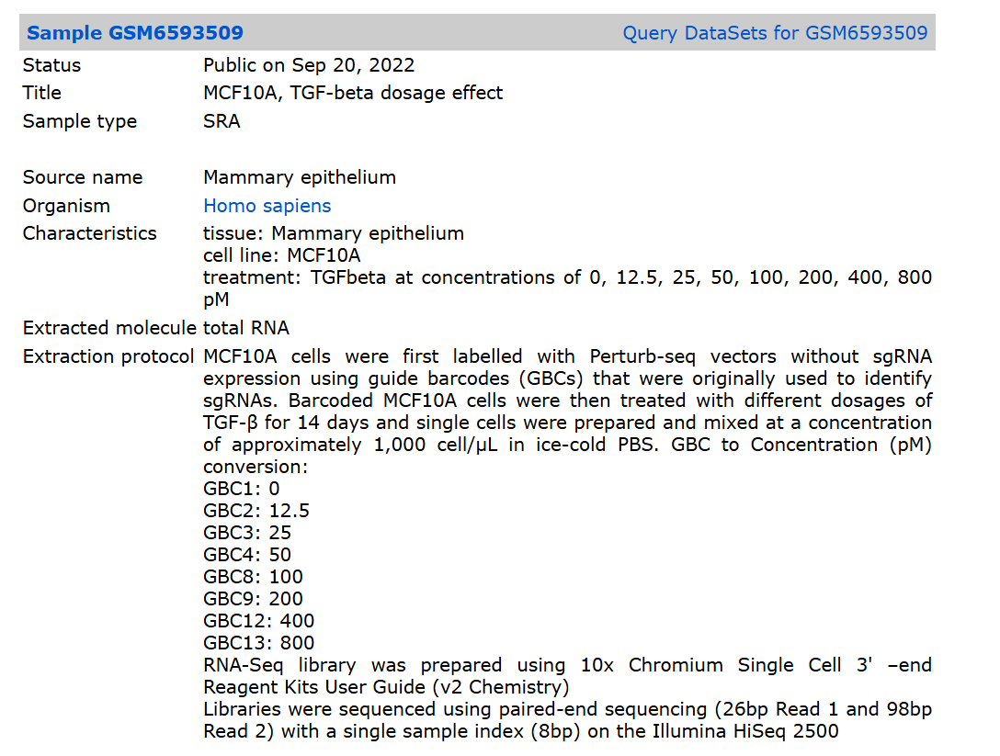

In [11]:
adata.obs=adata.obs.join(metadata)
adata.obs

,GBC_annot,Values
AAACCTGAGAAAGTGG-1,GBC2,2.0
AAACCTGAGACTAGGC-1,NaN,NaN
AAACCTGAGATCACGG-1,GBC4,4.0
AAACCTGAGCTCCTCT-1,GBC9,9.0
AAACCTGAGCTGCAAG-1,GBC1,1.0
...,...,...
TTTGTCAGTCTCAACA-1,GBC2,2.0
TTTGTCAGTTCGGGCT-1,GBC9,9.0
TTTGTCATCCCTAACC-1,GBC1,1.0
TTTGTCATCCTTCAAT-1,GBC9,9.0


In [12]:
adata=adata[~adata.obs.Values.isna()].copy()
adata

AnnData object with n_obs × n_vars = 8882 × 33694
    obs: 'GBC_annot', 'Values'

Basic quality control and preprocessing to remove potential doublets and low-quality cells:

In [13]:
sc.pp.filter_genes(adata, min_cells=10)

sc.pp.filter_cells(adata,min_genes=100)
sc.pp.filter_cells(adata,min_counts=100)
adata.shape

(8882, 16260)

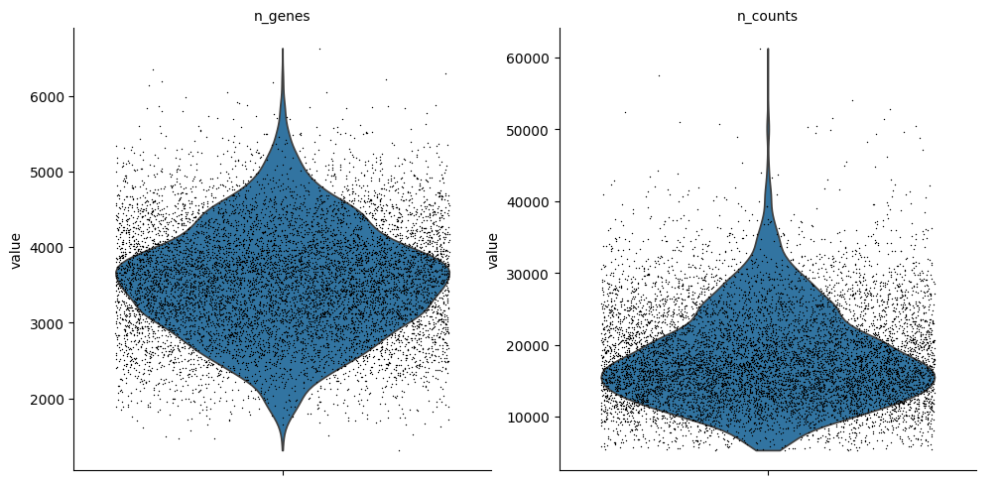

In [14]:
sc.pl.violin(adata, ['n_genes', 'n_counts'],
             jitter=0.4, multi_panel=True)

In [15]:
sc.pp.filter_cells(adata,max_genes=6000)
sc.pp.filter_cells(adata,max_counts=40000)
sc.pp.filter_genes(adata, min_cells=10)

In [16]:
bdata=adata.copy()

In [17]:
bdata.layers["counts"]=bdata.X.copy() # preserve raw counts before normalizing

# emt genes

The dataset contains thousands of genes, but we want to focus on those relating to EMT. We will download a list of genes relating to EMT from the Hallmark gene sets, a list from EMT cancer meta-programs and add some key transcription factors to preseve biologically relevant genes. We will use these genes to embed the data into a 2D representation that will reflect the EMT proccess.

In [18]:
!wget https://www.gsea-msigdb.org/gsea/msigdb/human/download_geneset.jsp?geneSetName=HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION&fileType=json

--2025-12-02 17:51:14--  https://www.gsea-msigdb.org/gsea/msigdb/human/download_geneset.jsp?geneSetName=HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION
Resolving www.gsea-msigdb.org (www.gsea-msigdb.org)... 44.218.58.128, 18.211.112.248, 18.215.98.213, ...
Connecting to www.gsea-msigdb.org (www.gsea-msigdb.org)|44.218.58.128|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 1308 (1.3K) [text/plain]
Saving to: ‘download_geneset.jsp?geneSetName=HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION’

download_geneset.js 100%[===================>]   1.28K  --.-KB/s    in 0s      

2025-12-02 17:51:14 (316 MB/s) - ‘download_geneset.jsp?geneSetName=HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION’ saved [1308/1308]



In [19]:
# Now, let's read the gene names from the text file
file_path = '/content/download_geneset.jsp?geneSetName=HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION'

emt_genes = []
with open(file_path, 'r') as f:
    # Skip the first two header lines
    next(f) # Skip gene set name
    next(f) # Skip URL
    for line in f:
        gene = line.strip() # Remove leading/trailing whitespace, including newline characters
        if gene: # Only add if the line is not empty
            emt_genes.append(gene)

print("First 10 EMT genes:")
print(emt_genes[:10])
print(f"Total EMT genes loaded: {len(emt_genes)}")

First 10 EMT genes:
['ABI3BP', 'ACTA2', 'ADAM12', 'ANPEP', 'APLP1', 'AREG', 'BASP1', 'BDNF', 'BGN', 'BMP1']
Total EMT genes loaded: 200


In [20]:
#https://www.weizmann.ac.il/sites/3CA/search-genes
mp = np.unique([
    "COL1A2","LAMC2","S100A6","KRT15","IL32","AGRN",
    "SPARC","LAMB3","ANXA2","CXCL14","KRT7","FLNB",
    "COL1A1","KRT17","LGALS1","DST","TNFRSF12A","ITGA3",
    "FN1","LAMA3","S100A10","SERPINF1","ANXA1","PLEC",
    "COL3A1","LGALS1","ANXA1","C1R","TM4SF1","CLSTN1",
    "COL6A2","MT2A","EMP3","COL17A1","ANXA3","HSPG2",
    "IGFBP7","PMEPA1","S100A11","EFEMP1","GPRC5A","ITGB4",
    "COL6A1","FLNA","TUBA1A","TXNIP","RND3","EHBP1L1",
    "TIMP3","S100A2","CD44","ALDH3A1","TACSTD2","EIF4G1",
    "VIM","PLAU","VIM","BCAM","KRT19","FAM83H",
    "BGN","PLAUR","CD9","C1S","LAMC2","FASN",
    "CALD1","PRSS23","S100A4","CAV1","EMP1","INTS1",
    "MGP","EMP3","LMNA","CD74","PLAUR","LAMA5",
    "LGALS1","TNFRSF12A","PLP2","DCN","CEACAM6","LAMB3",
    "C1S","CST6","TAGLN2","IGFBP7","S100A10","PMEPA1",
    "C1R","TGFBI","CAPG","LAMB3","KRT17","PTK7",
    "COL5A2","F3","CLIC1","CCL2","MMP7","ST14",
    "TAGLN","FSTL3","CRIP1","COL18A1","RAB11FIP1","TRIM28",
    "TIMP1","ITGA3","EMP1","DAPL1","C15ORF48","ATP1A1",
    "TPM2","ITGB4","EZR","HOPX","CLDN1","CLUH",
    "COL4A2","CAV1","KLF6","IFITM1","CLDN4","COL7A1",
    "DCN","COL17A1","LGALS3","KRT14","EDN1","FLNA",
    "IGFBP5","DCBLD2","MYADM","LDHB","LAMB3","FN1",
    "LUM","ITGA2","TMSB4X","LGALS1","PRSS23","GPC1",
    "NNMT","ITGAV","TNFRSF12A","MT2A","S100A16","LTBP3",
    "ACTA2","NDRG1","TSPO","NFIB","S100A2","MALAT1",
    "FSTL1","PDLIM7","CD63","NTRK2","CXCL8","PIEZO1",
    "MYL9","TNC","HSPB1","PSMB9","KLF6","PLXNA1",
    "VCAN","VIM","KLF2","SERPINE2","KLK10","PLXNB2",
    "COL6A3","ACTN1","SAT1","SERPINH1","KRT23","PXN",
    "CTHRC1","IL32","SH3BGRL3","SFRP1","LGALS1","SEC61A1",
    "SPARCL1","ITGB1","TIMP1","SPARC","S100A6","SLC7A5",
    "TPM1","SERPINE1","TPM4","ANTXR1","CAV2","TMEM259",
    "PCOLCE","FAM83A","TSC22D3","ASS1","CCND1","TTYH3",
    "SERPINF1","IGFBP3","ADGRE5","C12ORF75","CD24","COL16A1",
    "AEBP1","IGFBP6","AHNAK","IFITM3","CXCL1","CSPG4",
    "CTGF","IGFBP7","ARL6IP5","IGFBP5","FLNA","EFNB1",
    "MMP2","ITGB6","CD99","IL1R2","LMO7","EPHA2",
    "CCDC80","RBP1","FN1","LTF","TUBA1A","JAG2",
    "RARRES2","THBS1","GSN","MOXD1","F3","MBD3",
    "THY1","ITGA6","MYL12A","PDPN","PHLDA2","MMP14",
    "IGFBP4","SERPINE2","DBI","RAMP1","TIMP2","MT-CO3",
    "POSTN","PHLDA1","ECM1","SEPP1","ANKRD36C","MT-ND1",
    "SERPING1","AREG","HCST","SLC47A2","CD55","NIBAN2",
    "FBLN1","NT5E","RHOC","TIMP1","CST6","PKN1",
    "A2M","MMP1","SPP1","TPM2","MACC1","PRRC2A",
    "COL5A1","PDPN","CALM1","C6ORF48","PMEPA1","RABL6",
    "THBS2","PTHLH","LRRFIP1","NINJ1","SOX4","TNRC18",
    "CTSK","MMP10","TM4SF1","SDCBP","GDF15","HTT",
    "SFRP2","INHBA","CD52","THBS2","ITGB8","LRP5"

])

emt_tf=["SNAI1","SNAI2","ZEB1","ZEB2","TWIST1","TWIST2"]
all_emt=np.unique(list(emt_genes)+list(mp)+emt_tf)
len(all_emt)


380

In [21]:
sc.pp.normalize_total(bdata)
sc.pp.log1p(bdata)

In [22]:
bdata=bdata[:,np.intersect1d(bdata.var_names,list(all_emt))].copy()
bdata

AnnData object with n_obs × n_vars = 8822 × 332
    obs: 'GBC_annot', 'Values', 'n_genes', 'n_counts'
    var: 'n_cells'
    uns: 'log1p'
    layers: 'counts'

After log-normalizing and subsetting out genes, we will use principal component analysis (PCA) to reduce the dimensionality of our data. Plotting the drug values and gene loadings shows that the first principal component captures a lot of the variation regarding EMT. This suggests that the relevant information for EMT is represented nicely in PCA-space.

*While more sophisticated methods exist for dimensionalty reduction of SC data (e.g. variational autoencoders, Transformers), PCA is sufficent for our purpose of data exploration as we aren't interested in integrating between different batches, generating corrected counts etc.  

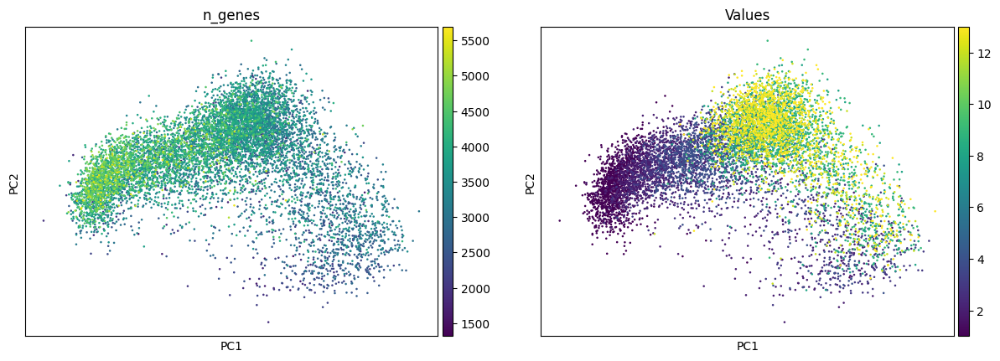

In [23]:
sc.pp.pca(bdata)
sc.pl.pca(bdata,color=["n_genes","Values"])

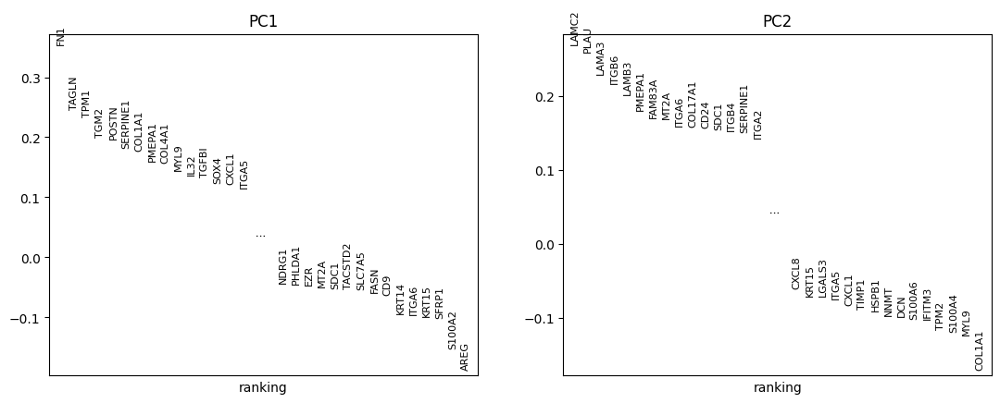

In [24]:
sc.pl.pca_loadings(bdata,[1,2])

To refine the 2D representation, we calculate a nearest-neighbor graph based on PCA-space and represent the data in 2D with UMAP.

Here too, we can see how the drug values correlate with the UMAP axes.

Beyond the drug values, we will also plot gene expression of epithelial and mesenchymal markers and transcription factors implicated in EMT.

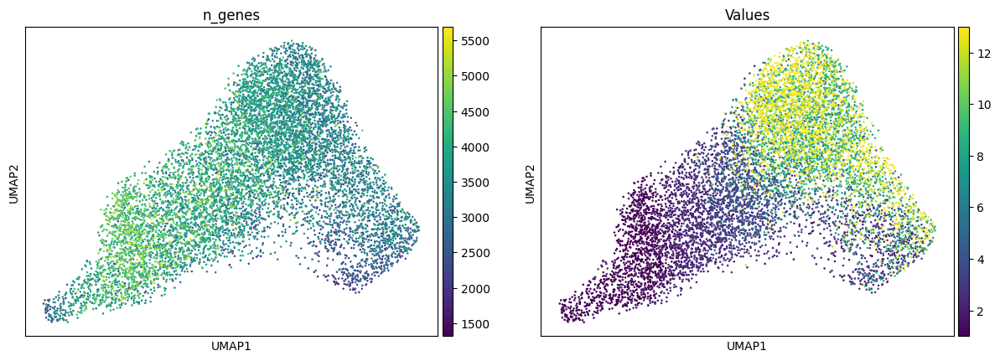

In [25]:
sc.pp.neighbors(bdata)
sc.tl.umap(bdata)
sc.pl.umap(bdata,color=["n_genes","Values"])

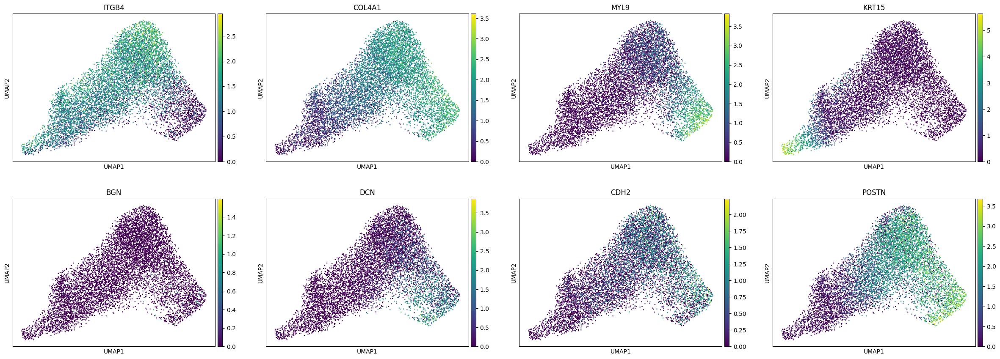

In [26]:
sc.pl.umap(bdata,color=["ITGB4","COL4A1","MYL9","KRT15","BGN","DCN","CDH2","POSTN"])

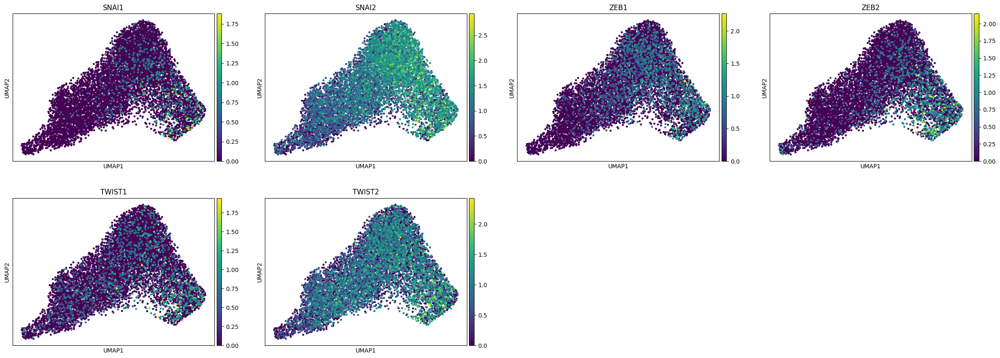

In [27]:

sc.pl.umap(bdata,color=emt_tf,size=50)

Based on the UMAPs, we can see how the expression of mesenchymal markers and EMT transcription factors is higher as the values of the drug increase.

This means that the values are a good proxy for EMT status in the and we will use these values to assign EMT status to the ST.

Before deconvolution, we will pseudobulk the SC data based on drug values similar to the celltype aggregation.

In [56]:
pb_data=sc.get.aggregate(adata,by="Values",func="mean")
pb_data.X=pb_data.layers["mean"].copy()
pb_data.X=pb_data.X.astype(int)
pb_data.obs["Values"]=pb_data.obs_names
pb_data

AnnData object with n_obs × n_vars = 8 × 16230
    obs: 'Values'
    var: 'n_cells'
    layers: 'mean'

In [57]:
tc.tl.annotate(st_adata, reference=pb_data, annotation_key='Values', result_key='emt_values',
               method='OT',  lamb=0,
               min_counts_per_cell=1, min_cells_per_gene=1, min_genes_per_cell=1,
               min_log2foldchange=0,
               remove_mito=True, n_hvg=None,  verbose=3, )

Starting preprocessing
Annotation profiles were not found in `reference.varm["Values"]`. Constructing reference profiles with `tacco.preprocessing.construct_reference_profiles` and default arguments...
mito: good gene fraction 0.9991990141712878 good count fraction 0.9502201298984351
Finished preprocessing in 1.77 seconds.
Starting annotation of data with shape (664, 2061) and a reference of shape (8, 2061) using the following wrapped method:
+- platform normalization: platform_iterations=0, gene_keys=Values, normalize_to=adata
   +- multi center: multi_center=None multi_center_amplitudes=True
      +- bisection boost: bisections=4, bisection_divisor=3
         +- core: method=OT annotation_prior=None lamb=0
mean,std( rescaling(gene) )  229.15090636156788 390.0996989552002
bisection run on 1
bisection run on 0.6666666666666667
bisection run on 0.4444444444444444
bisection run on 0.2962962962962963
bisection run on 0.19753086419753085
bisection run on 0.09876543209876543
Finished annota

AnnData object with n_obs × n_vars = 664 × 15686
    obs: 'in_tissue', 'array_row', 'array_col', 'assay_ontology_term_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'subtype', 'Classification', 'donor_id', 'Grade', 'Cancer Type', 'ER', 'PR', 'HER2 IHC', 'HER2 ISH (ratio)', 'Ki67', 'Subtype by IHC', 'Treatment status', 'Stage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'B cells Memory', 'B cells Naive', 'CAFs MSC iCAF-like', 'CAFs myCAF-like', 'Cancer Basal SC', 'Cancer Cycling', 'Cancer Her2 SC', 'Cancer LumA SC', 'Cancer LumB SC', 'Cycling PVL', 'Cycling T-cells', 'Cycling_Myeloid', 'DCs', 'Endothelial ACKR1', 'Endothelial CXCL12', 'Endothelial Lymphatic LYVE1', 'Endothelial RGS5', 'Luminal Progenitors', 'Macrophage', 'Mature Luminal', 'Monocyte', 'Myoepithelial', 'NK cells', 'NKT cells', 'PVL Differentiated', 'PVL Immature', '

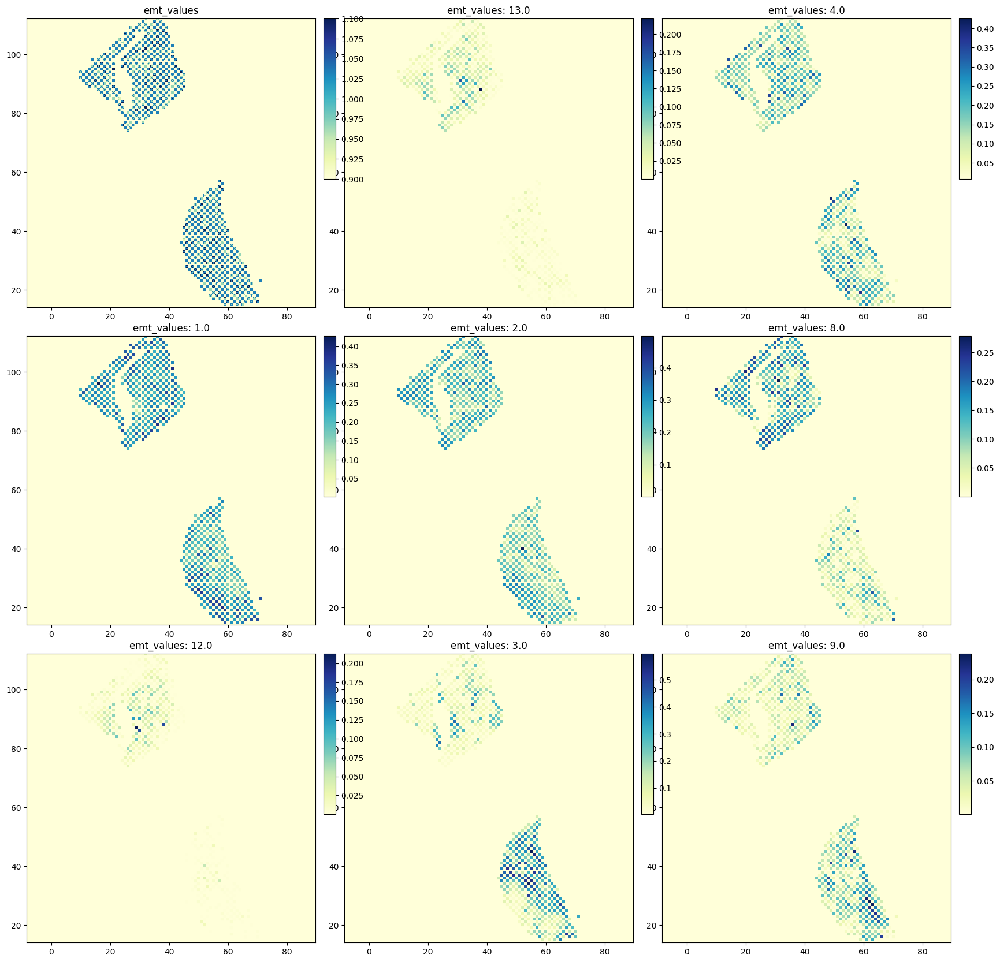

In [58]:
tc.pl.scatter(st_adata,keys="emt_values",position_key=('array_row', 'array_col'),cmap="YlGnBu",joint=None,n_cols=3,point_size=10);

Similar to cell-type deconvolution, we receive CTPs for the drug/EMT values. We will use these proportions to give each spot a weighted average of the values, resulting in one value per spot.

In [59]:
st_adata.obs["emt_mm"]=st_adata.obsm["emt_values"].to_numpy() @ st_adata.obsm["emt_values"].columns.astype(float).to_numpy().T

/tmp/ipython-input-2001587535.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(st_adata,color="emt_mm",library_id='CID44971',spot_size=100,vmax="p99")


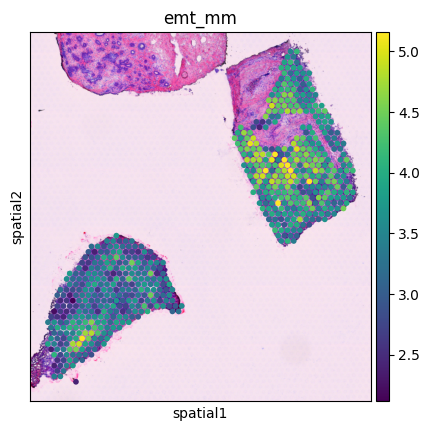

In [60]:
sc.pl.spatial(st_adata,color="emt_mm",library_id='CID44971',spot_size=100,vmax="p99")

Finally, we can examine the correlations between immune cells and EMT status.

For the coarser cell type annotations, T Cells, NK, and Naive B cells  appear to correlate with EMT, while Myeloid cells (Macrophages, Monocytes)  and Memory B cells are negatively correlated.

In [61]:
st_adata.obsm['celltype_minor']['emt_mm'] = st_adata.obs["emt_mm"]


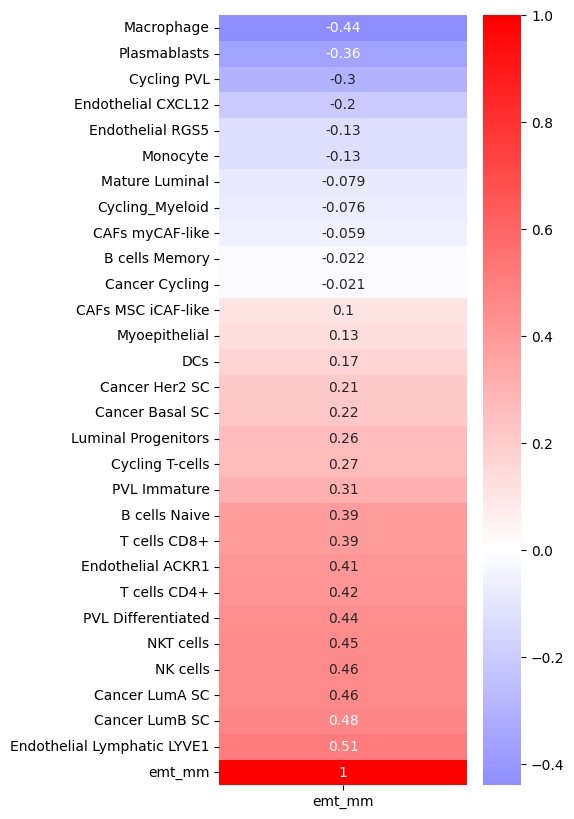

In [62]:
emt_corr=st_adata.obsm['celltype_minor'].corr("spearman")["emt_mm"].sort_values()
with plt.rc_context({'figure.figsize': (4, 10)}):
  sns.heatmap(emt_corr.to_frame(),center=0,cmap="bwr",annot=True)

In [63]:
st_adata.obsm['celltype_subset']['emt_mm'] = st_adata.obs["emt_mm"]


Using the finer annotations tells a different story!

 The higher resolution shows how within the coarse celltypes, there are special populations of Monocytes and Dendritic cells that are correlated with EMT.



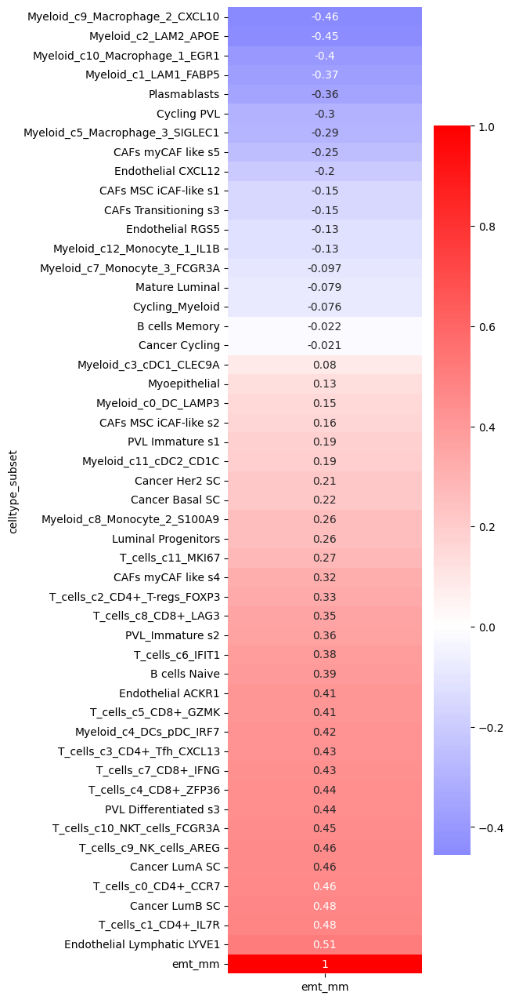

In [64]:
emt_corr=st_adata.obsm['celltype_subset'].corr("spearman")["emt_mm"].sort_values()
with plt.rc_context({'figure.figsize': (4, 16)}):
  sns.heatmap(emt_corr.to_frame(),center=0,cmap="bwr",annot=True)

 While we still can't say much about the mechanistic relationship of the immune cells to EMT, our results are interesting and can be used to generate new hypotheses and ideas for experiments.

 Some ideas for further computational analysis can be looking at ligand-receptor interactions or analyzing metabolic crosstalk between cells.

Key concepts and skills that can be learned from this tutorial are:
1) Accessing and downloading SC and ST data from public resources.
2) Exploratory data analysis and visualization of SC and ST.
3) Basic quality control and preprocessing of SC and ST.
4) Deconvolution of ST with categorical and quantitative information along with OT basics.
5) Analyzing gene expression and gene signatures in SC.
6) Feature selection of biologically relevant genes.
7) Dimensionality reduction of SC data.
8) Inference of cell-cell co-localizations and potential cell-cell interactions in ST.
9) Analyzing SC and ST data with variable degrees of annotations.